# Hospital Readmission for Diabetic Patients - EDA

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

## Data Cleaning 

In [2]:
diabetes_id = pd.read_csv(r'/Users/lilychen/Desktop/Institute of Data/Capstone/IDs_mapping.csv', index_col=0)

pd.set_option('display.max_rows', diabetes_id.shape[0]+1)
diabetes_id

,description
admission_type_id,
1,Emergency
2,Urgent
3,Elective
4,Newborn
5,Not Available
6,NaN
7,Trauma Center
8,Not Mapped
NaN,NaN


In [3]:
diabetes = pd.read_csv(r'/Users/lilychen/Desktop/Institute of Data/Capstone/diabetic_data.csv')

In [4]:
diabetes.shape

(101766, 50)

In [5]:
diabetes.head(10).T

,0,1,2,3,4,5,6,7,8,9
encounter_id,2278392,149190,64410,500364,16680,35754,55842,63768,12522,15738
patient_nbr,8222157,55629189,86047875,82442376,42519267,82637451,84259809,114882984,48330783,63555939
race,Caucasian,Caucasian,AfricanAmerican,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian
gender,Female,Female,Female,Male,Male,Male,Male,Male,Female,Female
age,[0-10),[10-20),[20-30),[30-40),[40-50),[50-60),[60-70),[70-80),[80-90),[90-100)
weight,?,?,?,?,?,?,?,?,?,?
admission_type_id,6,1,1,1,1,2,3,1,2,3
discharge_disposition_id,25,1,1,1,1,1,1,1,1,3
admission_source_id,1,7,7,7,7,2,2,7,4,4
time_in_hospital,1,3,2,2,1,3,4,5,13,12


In [6]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
encounter_id                101766 non-null int64
patient_nbr                 101766 non-null int64
race                        101766 non-null object
gender                      101766 non-null object
age                         101766 non-null object
weight                      101766 non-null object
admission_type_id           101766 non-null int64
discharge_disposition_id    101766 non-null int64
admission_source_id         101766 non-null int64
time_in_hospital            101766 non-null int64
payer_code                  101766 non-null object
medical_specialty           101766 non-null object
num_lab_procedures          101766 non-null int64
num_procedures              101766 non-null int64
num_medications             101766 non-null int64
number_outpatient           101766 non-null int64
number_emergency            101766 non-null int64
number_inpatient            10176

- Noticed there are '?' in several columns which are not identified as null values.

In [7]:
# Replace ? as nan
diabetes = diabetes.replace('?',np.nan)  

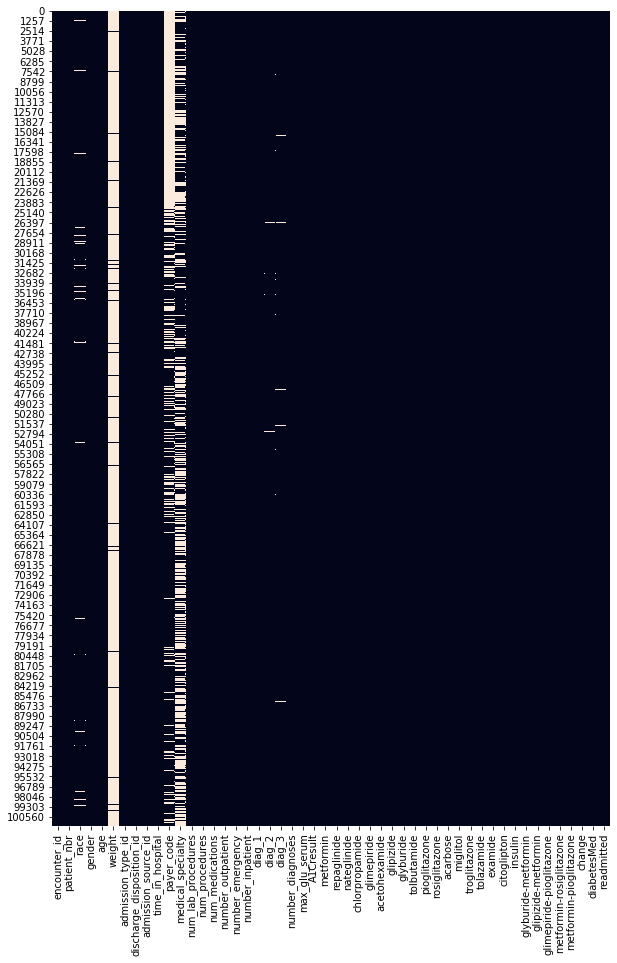

In [8]:
fig, ax = plt.subplots(figsize=(10,15))         # Sample figsize in inches
sns.heatmap(diabetes.isnull(), cbar=False);

- columns 'weight', 'payer_code' and 'medical_specialty' is high in missing values.

In [9]:
diabetes.discharge_disposition_id.value_counts().sort_index()

1     60234
2      2128
3     13954
4       815
5      1184
6     12902
7       623
8       108
9        21
10        6
11     1642
12        3
13      399
14      372
15       63
16       11
17       14
18     3691
19        8
20        2
22     1993
23      412
24       48
25      989
27        5
28      139
Name: discharge_disposition_id, dtype: int64

In [10]:
## Drop out patients that have passed away during the encounter
# ~ = is not in 
diabetes = diabetes[~diabetes.discharge_disposition_id.isin([11,19,20,21])]

In [11]:
# Drop out ID-related columns
# Drop out columns high in missing values 

id_list = ['encounter_id', 'patient_nbr', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id']
high_nan_list = ['weight', 'payer_code', 'medical_specialty']
diabetes.drop(columns=id_list + high_nan_list, inplace=True)
diabetes.dropna(subset=['race'], inplace=True)

In [12]:
diag_df = diabetes.loc[:, ['diag_1', 'diag_2', 'diag_3']] 
for column in diag_df:
    print(column, 'unique values:', len(diag_df[column].unique()))

diag_1 unique values: 714
diag_2 unique values: 745
diag_3 unique values: 785


In [13]:
# Drop out diag columns as too many unique numbers, hard to classify 
diag_list = ['diag_1', 'diag_2', 'diag_3']
diabetes.drop(columns=diag_list, inplace=True)

In [14]:
print('--Examine the data type--')
print(diabetes.dtypes)

--Examine the data type--
race                        object
gender                      object
age                         object
time_in_hospital             int64
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride                 object
acetohexamide               object
glipizide                   object
glyburide                   object
tolbutamide                 object
pioglitazone                object
rosiglitazone               object
acarbose                    object
miglitol                    object
troglitazone                object
tolazamide                  o

- Most of the columns are in the form of object type 
- Require further exploration for the values in each columns for further transformation 

In [15]:
# Outcome variable: readmitted  
diabetes.readmitted.value_counts()

NO     51699
>30    35007
<30    11169
Name: readmitted, dtype: int64

- Noticed there is 3 kinds of values in the outcome variable column - requires transformation to binary outcomes 
- NO = no record of readmission, decided to use 30 days as the threshold to classify readmission. 
- Use 30 days as a threshold to determine readmission as a result of recurrent condition 

In [16]:
# Combine readmitted columns to binary outcome: 
diabetes['readmitted'] = diabetes['readmitted'].apply(lambda x: 1 if x == '<30' else 0)

In [17]:
diabetes.readmitted.value_counts()

0    86706
1    11169
Name: readmitted, dtype: int64

In [18]:
diabetes.gender.value_counts()

Female             52742
Male               45132
Unknown/Invalid        1
Name: gender, dtype: int64

In [19]:
# Remove patient with Unknown/Invalid gender 
# Replace Female=0, Male=1
diabetes = diabetes.loc[diabetes['gender'] != 'Unknown/Invalid'] 
diabetes['gender'] = diabetes['gender'].apply(lambda x: 0 if x == 'Female' else 1)                  

In [20]:
diabetes.diabetesMed.value_counts()

Yes    75423
No     22451
Name: diabetesMed, dtype: int64

In [21]:
# Explore the values of the 23 drug-related columns 
columns = diabetes.columns[diabetes.columns.get_loc('metformin'):diabetes.columns.get_loc('metformin-pioglitazone')+1].to_list()
for i in columns: 
    print('--'*15)
    print(diabetes[i].value_counts())

------------------------------
No        78441
Steady    17832
Up         1039
Down        562
Name: metformin, dtype: int64
------------------------------
No        96357
Steady     1364
Up          108
Down         45
Name: repaglinide, dtype: int64
------------------------------
No        97186
Steady      654
Up           23
Down         11
Name: nateglinide, dtype: int64
------------------------------
No        97790
Steady       77
Up            6
Down          1
Name: chlorpropamide, dtype: int64
------------------------------
No        92881
Steady     4490
Up          318
Down        185
Name: glimepiride, dtype: int64
------------------------------
No        97873
Steady        1
Name: acetohexamide, dtype: int64
------------------------------
No        85552
Steady    11033
Up          751
Down        538
Name: glipizide, dtype: int64
------------------------------
No        87576
Steady     8967
Up          788
Down        543
Name: glyburide, dtype: int64
-----------------

- Most of the columns contain four types of values: No, Steady, Up, Down 
- Decided to transform the values to binary outcomes 
- Two new columns will be created: 'med_dosage_numchange' and 'prescribed_meds_num'
- insulin shows good distribution amongst the four values thus will be used to create two new columns separately: 'insulin_administration' and 'insulin_dosage_change'. 

In [22]:
# Find columns number for medication columns that needs to be reformat 
# CAN DELETE???
print('metformin locates at column number {}'.format(diabetes.columns.get_loc('metformin')))
print('citoglipton locates at column number {}'.format(diabetes.columns.get_loc('citoglipton')))
print('glyburide-metformin locates at column number {}'.format(diabetes.columns.get_loc('glyburide-metformin')))
print('metformin-pioglitazone locates at column number {}'.format(diabetes.columns.get_loc('metformin-pioglitazone')))

metformin locates at column number 13
citoglipton locates at column number 29
glyburide-metformin locates at column number 31
metformin-pioglitazone locates at column number 35


In [23]:
# creating a list of dataframe columns 
# columns1 = diabetes.columns[16:33].to_list()
# columns2 = diabetes.columns[34:39].to_list()
columns1 = diabetes.columns[diabetes.columns.get_loc('metformin'):diabetes.columns.get_loc('citoglipton')+1].to_list()
columns2 = diabetes.columns[diabetes.columns.get_loc('glyburide-metformin'):diabetes.columns.get_loc('metformin-pioglitazone')+1].to_list()
col_list = columns1 + columns2


# Convert all meds to 1=takes med (up, down, steady) and 0=not taking meds (no) 
for i in col_list: 
    temp_colname = str(i) + 'temp'
    diabetes[temp_colname] = diabetes[i].apply(lambda x: 0 if x == 'No' else 1)
    
diabetes['num_prescribed_meds'] = 0   
for i in col_list:
    temp_colname = str(i) + 'temp'
    diabetes['num_prescribed_meds'] = diabetes['num_prescribed_meds'] + diabetes[temp_colname]    
    del diabetes[temp_colname]

In [24]:
diabetes['num_prescribed_meds'].value_counts()

0    51914
1    30774
2    12695
3     2391
4       94
5        5
6        1
Name: num_prescribed_meds, dtype: int64

In [25]:
# Convert all meds to 1=change in med (up, down) and 0=no change in med (no, Steady) 
for i in col_list: 
    temp_colname = str(i) + 'temp'
    diabetes[temp_colname] = diabetes[i].apply(lambda x: 0 if (x == 'No' or x == 'Steady') else 1)

diabetes['numchange_med_dosage'] = 0   
for i in col_list:
    temp_colname = str(i) + 'temp'
    diabetes['numchange_med_dosage'] = diabetes['numchange_med_dosage'] + diabetes[temp_colname]    
    del diabetes[temp_colname]
    
# Drop the meds columns 
diabetes.drop(columns=col_list, inplace=True)

In [26]:
diabetes['numchange_med_dosage'].value_counts()

0    92708
1     4801
2      354
3       10
4        1
Name: numchange_med_dosage, dtype: int64

In [27]:
# insulin_related columns
diabetes['insulin_administration'] = diabetes['insulin'].apply(lambda x: 0 if x == 'No' else 1)
diabetes['insulin_dosage_change'] = diabetes['insulin'].apply(lambda x: 1 if (x == 'Down' or x == 'Up') else 0)

In [28]:
# Drop unneeded columns 
col_drop = ['insulin', 'change', 'diabetesMed'] 
diabetes.drop(columns=col_drop, inplace=True)

In [29]:
# Explore age column 
print('Column "age" Data Type: {}'.format(diabetes.age.dtypes))
print('Column "age" Value Counts:')
print(diabetes.age.value_counts().sort_index())

Column "age" Data Type: object
Column "age" Value Counts:
[0-10)        159
[10-20)       682
[20-30)      1604
[30-40)      3689
[40-50)      9408
[50-60)     16743
[60-70)     21697
[70-80)     24974
[80-90)     16318
[90-100)     2600
Name: age, dtype: int64


In [30]:
age_dict = {'[0-10)':0,
            '[10-20)':10,
            '[20-30)':20,
            '[30-40)':30,
            '[40-50)':40,
            '[50-60)':50,
            '[60-70)':60,
            '[70-80)':70,
            '[80-90)':80,
            '[90-100)':90}
diabetes['age'] = diabetes['age'].replace(age_dict)

In [31]:
diabetes['max_glu_serum'].value_counts(normalize=True)

None    0.947177
Norm    0.026033
>200    0.014519
>300    0.012271
Name: max_glu_serum, dtype: float64

In [32]:
diabetes['A1Cresult'].value_counts(normalize=True)

None    0.831876
>8      0.080685
Norm    0.049615
>7      0.037824
Name: A1Cresult, dtype: float64

In [33]:
diabetes['race'].value_counts(normalize=True)

Caucasian          0.764708
AfricanAmerican    0.192983
Hispanic           0.020680
Other              0.015173
Asian              0.006457
Name: race, dtype: float64

- In columns 'max_glu_serum' and 'A1Cresult', majority of the data values are None (not measured).
- Column 'race' data values are also in majority of Caucasian
- Decided to drop these three columns

In [34]:
diabetes.drop(columns=['max_glu_serum', 'A1Cresult', 'race'], inplace=True)

In [35]:
diabetes.rename(columns={"time_in_hospital": 'days_in_hospital'}, inplace=True)

In [36]:
# Rearrange the columns so that the outcome variable column 'readmitted' is at the end
diabetes = diabetes.drop(columns=['readmitted']).assign(readmitted=diabetes['readmitted'])

In [37]:
diabetes

,gender,age,days_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,num_prescribed_meds,numchange_med_dosage,insulin_administration,insulin_dosage_change,readmitted
0,0,0,1,41,0,1,0,0,0,1,0,0,0,0,0
1,0,10,3,59,0,18,0,0,0,9,0,0,1,1,0
2,0,20,2,11,5,13,2,0,1,6,1,0,0,0,0
3,1,30,2,44,1,16,0,0,0,7,0,0,1,1,0
4,1,40,1,51,0,8,0,0,0,5,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,1,70,3,51,0,16,0,0,0,9,1,0,1,1,0
101762,0,80,5,33,3,18,0,0,1,9,0,0,1,0,0
101763,1,70,1,53,0,9,1,0,0,13,1,0,1,1,0
101764,0,80,10,45,2,21,0,0,1,9,2,0,1,1,0


## Data Directory 

- gender: 0 = Female, 1 = Male

- age: Grouped in 10-year intervals: [0-10), [10-20), ..., [90-100)

- days_in_hospital: Number of days between admission and discharge

- num_lab_procedures: Number of lab tests performed during the encounter

- num_procedures: Number of procedures (other than lab tests) performed during the encounter

- num_medications: Number of distinct generic names administered during the encounter

- number_outpatient: Number of outpatient visits of the patient in the year preceding the encounter

- number_emergency: Number of emergency visits of the patient in the year preceding the encounter

- number_inpatient: Number of inpatient visits of the patient in the year preceding the encounter

- number_diagnoses: Number of diagnoses entered to the system

- num_prescribed_meds: Number of diabetic medication prescribed

- numchange_med_dosage: Number of dosage change of the prescribed diabetic medication 

- insulin_administration: 0 = No Administration of Insulin, 1 = Administration of Insulin

- insulin_dosage_change: 0 = No change of insuline dosage, 1 = Change of insulin dosage 

- readmitted: 0 = No readmission within 30days, 1 = the patient was readmitted within 30 days after discharged. 

## EDA 

In [64]:
sns.set_style('darkgrid')
pd.options.display.float_format = "{:.3f}".format
from pandas.plotting import register_matplotlib_converters

In [39]:
diabetes.shape

(97874, 15)

In [40]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 97874 entries, 0 to 101765
Data columns (total 15 columns):
gender                    97874 non-null int64
age                       97874 non-null int64
days_in_hospital          97874 non-null int64
num_lab_procedures        97874 non-null int64
num_procedures            97874 non-null int64
num_medications           97874 non-null int64
number_outpatient         97874 non-null int64
number_emergency          97874 non-null int64
number_inpatient          97874 non-null int64
number_diagnoses          97874 non-null int64
num_prescribed_meds       97874 non-null int64
numchange_med_dosage      97874 non-null int64
insulin_administration    97874 non-null int64
insulin_dosage_change     97874 non-null int64
readmitted                97874 non-null int64
dtypes: int64(15)
memory usage: 11.9 MB


- 15 columns with 97874 rows 
- Nil null or missing values 
- All data with data types 

In [41]:
diabetes.describe()

,gender,age,days_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,num_prescribed_meds,numchange_med_dosage,insulin_administration,insulin_dosage_change,readmitted
count,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000,97874.000
mean,0.461,60.818,4.392,42.919,1.332,15.987,0.373,0.202,0.640,7.426,0.651,0.057,0.532,0.232,0.114
std,0.498,15.950,2.976,19.641,1.698,8.084,1.273,0.945,1.270,1.931,0.804,0.248,0.499,0.422,0.318
min,0.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
25%,0.000,50.000,2.000,31.000,0.000,10.000,0.000,0.000,0.000,6.000,0.000,0.000,0.000,0.000,0.000
50%,0.000,60.000,4.000,44.000,1.000,15.000,0.000,0.000,0.000,8.000,0.000,0.000,1.000,0.000,0.000
75%,1.000,70.000,6.000,57.000,2.000,20.000,0.000,0.000,1.000,9.000,1.000,0.000,1.000,0.000,0.000
max,1.000,90.000,14.000,132.000,6.000,81.000,42.000,76.000,21.000,16.000,6.000,4.000,1.000,1.000,1.000


In [42]:
diabetes.readmitted.value_counts()

0    86705
1    11169
Name: readmitted, dtype: int64

No Readmission (0): 88.59% 
Readmission (1): 11.41%


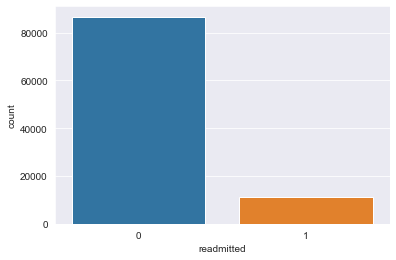

In [44]:
# Outcome Variable
sns.countplot(x='readmitted', data=diabetes);
print('No Readmission (0): {0:.2f}%'.format(diabetes['readmitted'].value_counts(normalize=True)[0]*100),
    '\nReadmission (1): {0:.2f}%'.format(diabetes['readmitted'].value_counts(normalize=True)[1]*100))

In [65]:
diabetes.readmitted.value_counts(normalize=True).tolist()

[0.8858838915340131, 0.11411610846598688]

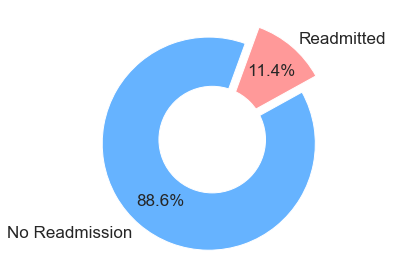

In [46]:
# Pie Chart
labels = ['No Readmission', 'Readmitted'] # diabetes.readmitted.unique().tolist()
sizes = diabetes.readmitted.value_counts(normalize=True).tolist()
explode = (0.05, 0.15)

colors = ['#66b3ff', '#ff9999'] # green: '#99ff99',
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=70, pctdistance=0.7, explode = explode, textprops={'fontsize': 17})

#draw circle
centre_circle = plt.Circle((0,0),0.50,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
plt.tight_layout()
plt.show()

- This is an imbalanced dataset in which almost 90% of the outcome values are 0. 
- Require balancing prior to modelling

In [47]:
def min_max_unique(df):
    """The function takes the dataframe as the argument and returns 
    the minimum and maximum values of each column and the number of 
    unique values in each column as a dataframe."""
    
    col_list = []
    min_list = []
    max_list = []
    num_list = []

    for column in df: 
        col_list.append(column)

        min_value = df[column].min()
        min_list.append(min_value)

        max_value = df[column].max()
        max_list.append(max_value)

        num_list.append(len(df[column].unique()))

    dic = {'Column': col_list,
           'Min Value': min_list, 
           'Max Value': max_list, 
           'Num of Unique Values': num_list}

    df = pd.DataFrame(dic, columns = ['Column', 'Min Value', 'Max Value', 'Num of Unique Values'])
    df = df.set_index('Column')
    return df

In [48]:
min_max_unique(diabetes)

,Min Value,Max Value,Num of Unique Values
Column,,,
gender,0,1,2
age,0,90,10
days_in_hospital,1,14,14
num_lab_procedures,1,132,118
num_procedures,0,6,7
num_medications,1,81,75
number_outpatient,0,42,39
number_emergency,0,76,33
number_inpatient,0,21,21


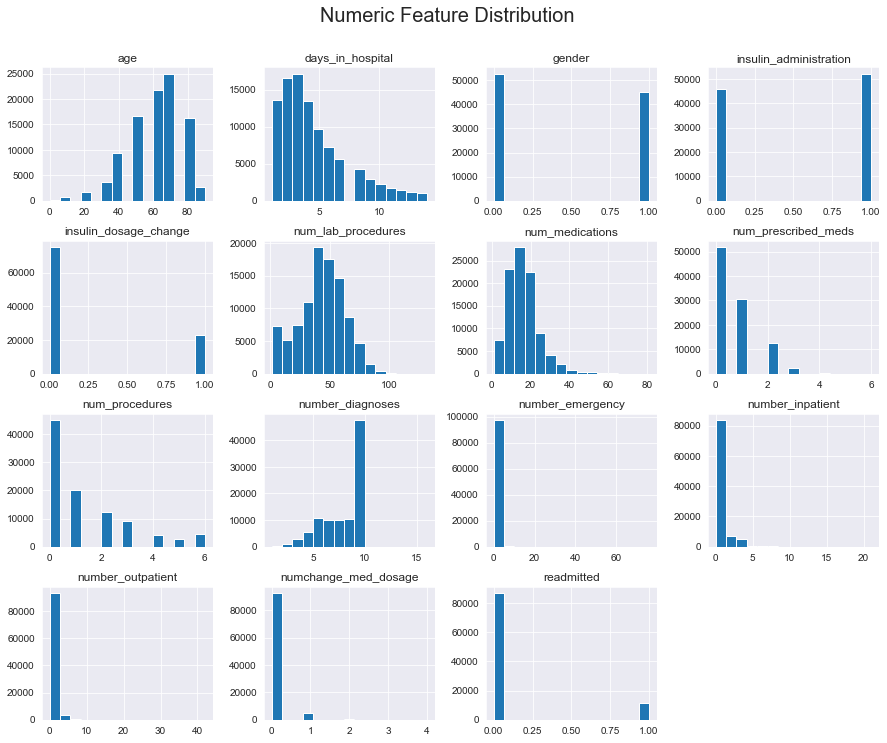

In [49]:
diabetes.hist(bins=15, figsize=(15,12));
plt.suptitle('Numeric Feature Distribution', y=0.95, fontsize=20)
plt.show()

In [50]:
def readmission_count_plot(hue):
    fig, ax = plt.subplots()
    sns.countplot(x='readmitted', hue=hue, data=diabetes);
    plt.title('Readmission Count by {}'.format(hue.capitalize()), fontsize=15);

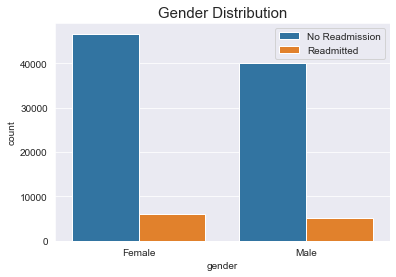

In [51]:
fig, ax = plt.subplots()
sns.countplot(x='gender', hue='readmitted', data=diabetes);
ax.set_xticklabels(['Female', 'Male'])
ax.legend(labels=['No Readmission', 'Readmitted'])
plt.title('Gender Distribution', fontsize=15);

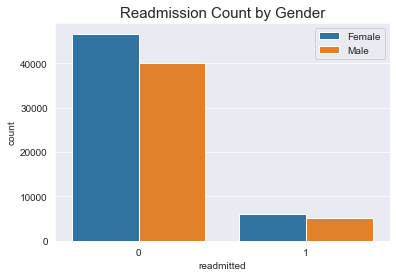

In [52]:
fig, ax = plt.subplots()
sns.countplot(x='readmitted', hue='gender', data=diabetes);
ax.legend(['Female', 'Male'])
plt.title('Readmission Count by Gender', fontsize=15);

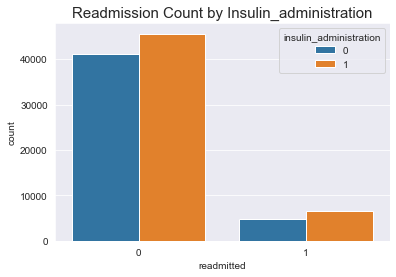

In [53]:
readmission_count_plot('insulin_administration')

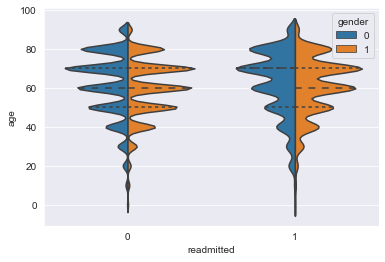

In [54]:
sns.violinplot(x="readmitted", y="age", hue="gender", data=diabetes, split=True, inner="quartile");

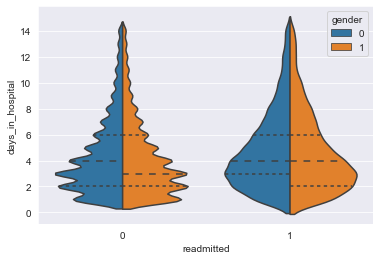

In [55]:
sns.violinplot(x="readmitted", y="days_in_hospital", hue="gender", data=diabetes, split=True, inner="quartile");

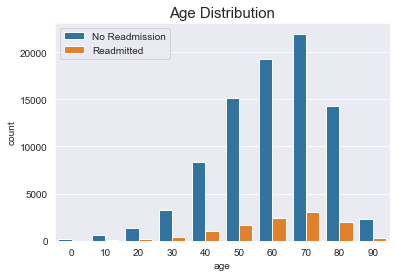

In [56]:
fig, ax = plt.subplots()
sns.countplot(x='age', hue='readmitted', data=diabetes);
ax.legend(labels=['No Readmission', 'Readmitted'])
plt.title('Age Distribution', fontsize=15);

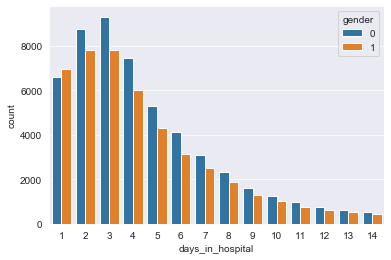

In [57]:
sns.countplot(x='days_in_hospital', hue='gender', data=diabetes);

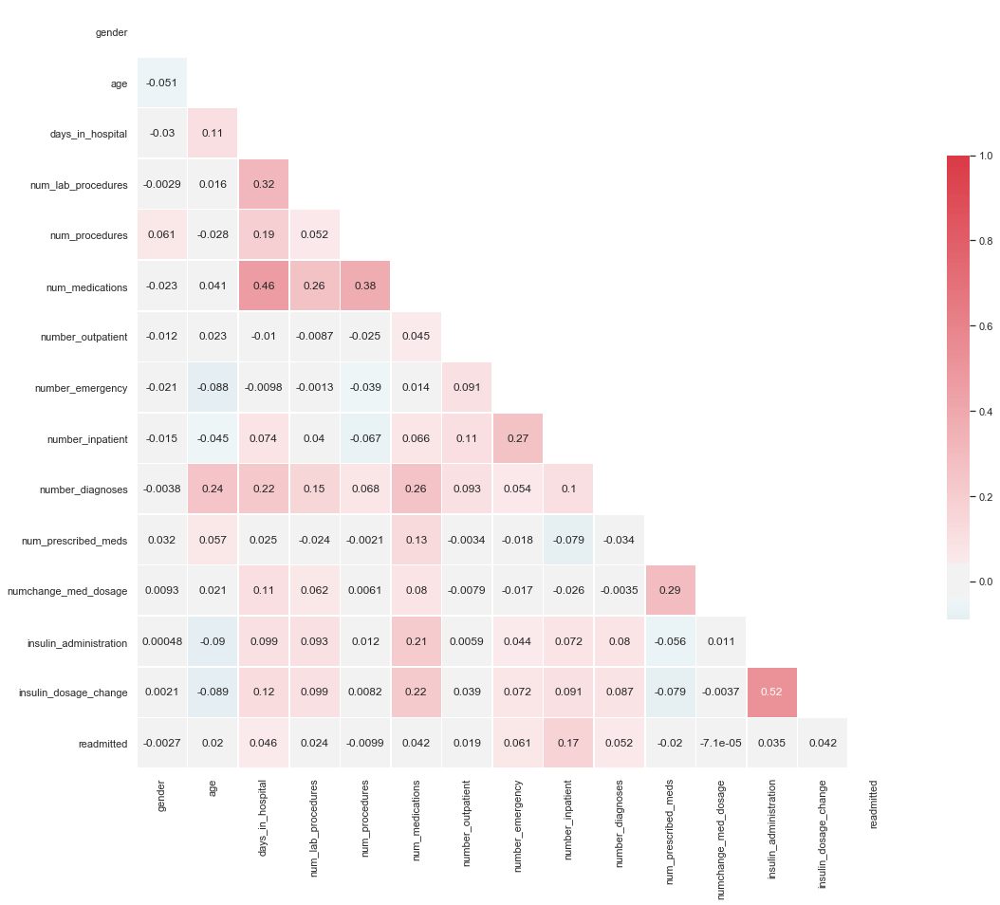

In [58]:
# Copied code from seaborn examples
# https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(diabetes.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(diabetes.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();

- Can see that most columns do not have much correlation with the target column 'readmitted'
- Require further exploration to determine the need for data transformation 

In [59]:
diabetes.loc[diabetes['readmitted']==0].describe().T

,count,mean,std,min,25%,50%,75%,max
gender,86705.000,0.462,0.499,0.000,0.000,0.000,1.000,1.000
age,86705.000,60.704,15.968,0.000,50.000,60.000,70.000,90.000
days_in_hospital,86705.000,4.343,2.966,1.000,2.000,4.000,6.000,14.000
num_lab_procedures,86705.000,42.753,19.678,1.000,31.000,44.000,57.000,129.000
num_procedures,86705.000,1.338,1.706,0.000,0.000,1.000,2.000,6.000
num_medications,86705.000,15.865,8.073,1.000,10.000,15.000,20.000,79.000
number_outpatient,86705.000,0.365,1.268,0.000,0.000,0.000,0.000,42.000
number_emergency,86705.000,0.181,0.871,0.000,0.000,0.000,0.000,76.000
number_inpatient,86705.000,0.564,1.128,0.000,0.000,0.000,1.000,19.000
number_diagnoses,86705.000,7.390,1.948,1.000,6.000,8.000,9.000,16.000


In [60]:
diabetes.loc[diabetes['readmitted']==1].describe().T

,count,mean,std,min,25%,50%,75%,max
gender,11169.000,0.457,0.498,0.000,0.000,0.000,1.000,1.000
age,11169.000,61.705,15.784,0.000,50.000,60.000,70.000,90.000
days_in_hospital,11169.000,4.771,3.031,1.000,2.000,4.000,6.000,14.000
num_lab_procedures,11169.000,44.207,19.301,1.000,33.000,45.000,58.000,132.000
num_procedures,11169.000,1.285,1.637,0.000,0.000,1.000,2.000,6.000
num_medications,11169.000,16.928,8.109,1.000,11.000,16.000,21.000,81.000
number_outpatient,11169.000,0.441,1.311,0.000,0.000,0.000,0.000,40.000
number_emergency,11169.000,0.362,1.381,0.000,0.000,0.000,0.000,64.000
number_inpatient,11169.000,1.235,1.965,0.000,0.000,1.000,2.000,21.000
number_diagnoses,11169.000,7.708,1.765,1.000,7.000,9.000,9.000,16.000


- Both outcome groups (0 and 1) show similar values distribution across features. 
- This corresponds with the heatmap, suggesting little correlation between features and outcome variable. 

CPU times: user 52.8 s, sys: 1.09 s, total: 53.8 s
Wall time: 53.8 s


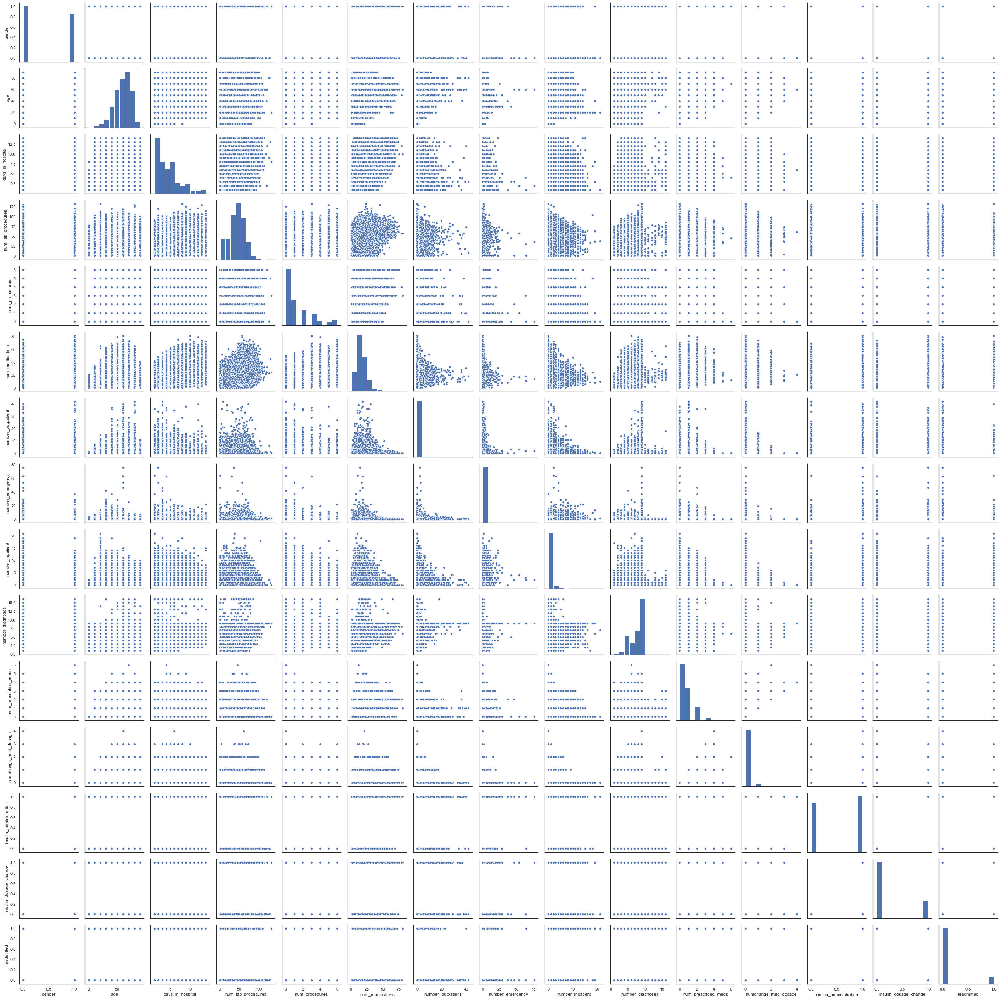

In [61]:
%%time
sns.pairplot(diabetes);

In [62]:
import pandas_profiling

In [63]:
diabetes.profile_report()

Conclusion: 
- Imbalanced dataset - require data balancing
- Features observed to give little predictive value to the outcome. Further feature engineering may be beneficial in creating new features that have higher correlation with the outcome. 
- Feature selection technique is required for deciding the most relevant features. 